# Bagian 4: Implementasi Arsitektur From Scratch

## Setup & Imports

In [1]:
import sys
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
import json
import time
import heapq
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
from collections import defaultdict

import tensorflow as tf
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
import nltk
nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)

PROJECT_ROOT = Path("../../")
sys.path.append(str(PROJECT_ROOT))

from src.utility.text_utils import TextTokenizer
from src.utility.image_utils import load_image
from src.nn import no_grad
from src.nn.layers.dense import Dense
from src.nn.layers.embedding import Embedding
from src.nn.layers.recurrent import SimpleRNNCell, LSTMCell
from src.nn.engine import Tensor

DATA_DIR      = PROJECT_ROOT / "data" / "2_rnn_image_captioning"
FEATURES_DIR  = DATA_DIR / "features"
IMAGES_DIR    = DATA_DIR / "images"
CAPTIONS_FILE = DATA_DIR / "captions.txt"
WEIGHTS_DIR   = PROJECT_ROOT / "models" / "rnn_lstm"
VOCAB_PATH    = DATA_DIR / "vocab.json"

SEED = 42
np.random.seed(SEED)

I0000 00:00:1778769522.720151  384391 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1778769522.881883  384391 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1778769526.109378  384391 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


## Load Data & Vocabulary

In [2]:
tokenizer = TextTokenizer()
tokenizer.load_vocab(str(VOCAB_PATH))

PAD_ID   = tokenizer.token_to_id["<pad>"]
START_ID = tokenizer.token_to_id["<start>"]
END_ID   = tokenizer.token_to_id["<end>"]
UNK_ID   = tokenizer.token_to_id["<unk>"]
VOCAB_SIZE = tokenizer.vocab_size

print(f"Vocabulary size : {VOCAB_SIZE}")
print(f"PAD={PAD_ID}, START={START_ID}, END={END_ID}, UNK={UNK_ID}")

Vocabulary size : 8832
PAD=0, START=1, END=2, UNK=3


In [ ]:
def load_captions(filepath):
    captions = defaultdict(list)
    with open(filepath, "r") as f:
        next(f)
        for line in f:
            line = line.strip()
            if not line:
                continue
            image_id, caption = line.split(",", 1)
            captions[image_id].append(caption.strip())
    return captions

all_captions = load_captions(CAPTIONS_FILE)
all_image_ids = sorted(all_captions.keys())
np.random.seed(SEED)
np.random.shuffle(all_image_ids)

n_train = 6000
n_val   = 1000
train_ids = all_image_ids[:n_train]
val_ids   = all_image_ids[n_train:n_train + n_val]
test_ids  = all_image_ids[n_train + n_val:]

print(f"Train: {len(train_ids)} | Val: {len(val_ids)} | Test: {len(test_ids)}")

Train: 6000 | Val: 1000 | Test: 1091


## From-Scratch Architecture Components

In [4]:
class MultiLayerRNN:
    def __init__(self, cells):
        self.cells = cells

    def forward(self, x_t, h_states):
        new_h = []
        inp = x_t
        for i, cell in enumerate(self.cells):
            h_new = cell.forward(inp, h_states[i])
            new_h.append(h_new)
            inp = h_new
        return inp, new_h


class MultiLayerLSTM:
    def __init__(self, cells):
        self.cells = cells

    def forward(self, x_t, h_states, c_states):
        new_h = []
        new_c = []
        inp = x_t
        for i, cell in enumerate(self.cells):
            h_new, c_new = cell.forward(inp, h_states[i], c_states[i])
            new_h.append(h_new)
            new_c.append(c_new)
            inp = h_new
        return inp, new_h, new_c

## Weight Loader from Keras

In [6]:
def load_rnn_decoder(keras_model_path, embed_dim, n_layers):
    with tf.device('/CPU:0'):
        keras_model = tf.keras.models.load_model(keras_model_path, safe_mode=False)
    weights = keras_model.get_weights()
    idx = 0

    proj_W = weights[idx]; idx += 1
    proj_b = weights[idx]; idx += 1
    proj_dense = Dense.from_weights(proj_W, proj_b, activation='linear')

    emb_W = weights[idx]; idx += 1
    embedding = Embedding.from_weights(emb_W)

    cells = []
    for _ in range(n_layers):
        W_ih = weights[idx]; idx += 1
        W_hh = weights[idx]; idx += 1
        b    = weights[idx]; idx += 1
        cells.append(SimpleRNNCell.from_weights(W_ih, W_hh, b))

    out_W = weights[idx]; idx += 1
    out_b = weights[idx]; idx += 1
    output_dense = Dense.from_weights(out_W, out_b, activation='softmax')

    return embedding, proj_dense, MultiLayerRNN(cells), output_dense


def load_lstm_decoder(keras_model_path, embed_dim, n_layers):
    with tf.device('/CPU:0'):
        keras_model = tf.keras.models.load_model(keras_model_path, safe_mode=False)
    weights = keras_model.get_weights()
    idx = 0

    proj_W = weights[idx]; idx += 1
    proj_b = weights[idx]; idx += 1
    proj_dense = Dense.from_weights(proj_W, proj_b, activation='linear')

    emb_W = weights[idx]; idx += 1
    embedding = Embedding.from_weights(emb_W)

    cells = []
    for _ in range(n_layers):
        W_ih = weights[idx]; idx += 1
        W_hh = weights[idx]; idx += 1
        b    = weights[idx]; idx += 1
        cells.append(LSTMCell.from_weights(W_ih, W_hh, b))

    out_W = weights[idx]; idx += 1
    out_b = weights[idx]; idx += 1
    output_dense = Dense.from_weights(out_W, out_b, activation='softmax')

    return embedding, proj_dense, MultiLayerLSTM(cells), output_dense

## Greedy Decoding (Pre-Inject)

In [7]:
def generate_greedy_rnn(image_features, embedding, proj_dense, rnn, output_dense, max_len=30):
    if image_features.ndim == 1:
        image_features = image_features.reshape(1, -1)
    B           = image_features.shape[0]
    hidden_size = rnn.cells[0].hidden_size
    n_layers    = len(rnn.cells)

    with no_grad():
        h_states = [Tensor(np.zeros((B, hidden_size))) for _ in range(n_layers)]

        x = proj_dense.forward(Tensor(image_features))
        _, h_states = rnn.forward(x, h_states)

        tokens   = np.full(B, START_ID, dtype=np.int32)
        captions = [[] for _ in range(B)]
        done     = np.zeros(B, dtype=bool)

        for _ in range(max_len):
            x = embedding.forward(tokens)
            h_out, h_states = rnn.forward(x, h_states)
            probs       = output_dense.forward(h_out)
            next_tokens = np.argmax(probs.data, axis=-1).flatten()

            for i in range(B):
                if not done[i]:
                    if next_tokens[i] == END_ID:
                        done[i] = True
                    else:
                        captions[i].append(int(next_tokens[i]))

            tokens = next_tokens
            if done.all():
                break

    return captions


def generate_greedy_lstm(image_features, embedding, proj_dense, lstm, output_dense, max_len=30):
    if image_features.ndim == 1:
        image_features = image_features.reshape(1, -1)
    B           = image_features.shape[0]
    hidden_size = lstm.cells[0].hidden_size
    n_layers    = len(lstm.cells)

    with no_grad():
        h_states = [Tensor(np.zeros((B, hidden_size))) for _ in range(n_layers)]
        c_states = [Tensor(np.zeros((B, hidden_size))) for _ in range(n_layers)]    

        x = proj_dense.forward(Tensor(image_features))
        _, h_states, c_states = lstm.forward(x, h_states, c_states)

        tokens   = np.full(B, START_ID, dtype=np.int32)
        captions = [[] for _ in range(B)]
        done     = np.zeros(B, dtype=bool)

        for _ in range(max_len):
            x = embedding.forward(tokens)
            h_out, h_states, c_states = lstm.forward(x, h_states, c_states)
            probs       = output_dense.forward(h_out)
            next_tokens = np.argmax(probs.data, axis=-1).flatten()

            for i in range(B):
                if not done[i]:
                    if next_tokens[i] == END_ID:
                        done[i] = True
                    else:
                        captions[i].append(int(next_tokens[i]))

            tokens = next_tokens
            if done.all():
                break

    return captions

## Evaluation Utilities

In [ ]:
def decode_ids(token_ids, tokenizer):
    return tokenizer.decode(token_ids)

def compute_bleu4(hypotheses, references_list):
    smoothie = SmoothingFunction().method4
    refs = []
    hyps = []
    for hyp_str, ref_strs in zip(hypotheses, references_list):
        hyp_tokens  = hyp_str.split()
        ref_tokens  = [r.split() for r in ref_strs]
        hyps.append(hyp_tokens)
        refs.append(ref_tokens)
    return corpus_bleu(refs, hyps, smoothing_function=smoothie)

def compute_meteor(hypotheses, references_list):
    scores = []
    for hyp_str, ref_strs in zip(hypotheses, references_list):
        score = meteor_score([r.split() for r in ref_strs], hyp_str.split())
        scores.append(score)
    return np.mean(scores)

def load_feature(image_id):
    path = FEATURES_DIR / f"{image_id}.npy"
    if not path.exists():
        stem = Path(image_id).stem
        path = FEATURES_DIR / f"{stem}.npy"
    if not path.exists():
        raise FileNotFoundError(f"Feature file not found for image_id={image_id!r}. "
                                f"Checked: {FEATURES_DIR / f'{image_id}.npy'} and "
                                f"{FEATURES_DIR / Path(image_id).stem}.npy")
    return np.load(str(path))

def evaluate_model(generate_fn, test_ids, all_captions, max_len=30, batch_size=32):
    hypotheses      = []
    references_list = []
    start_time      = time.time()
    test_ids_list   = list(test_ids)

    skipped = 0
    for i in range(0, len(test_ids_list), batch_size):
        batch_ids = test_ids_list[i:i + batch_size]

        valid_ids, valid_feats = [], []
        for img_id in batch_ids:
            try:
                valid_feats.append(load_feature(img_id))
                valid_ids.append(img_id)
            except FileNotFoundError:
                skipped += 1

        if not valid_ids:
            continue

        features   = np.array(valid_feats)
        batch_caps = generate_fn(features, max_len=max_len)

        for img_id, token_ids in zip(valid_ids, batch_caps):
            hypotheses.append(tokenizer.decode(token_ids))
            references_list.append(all_captions[img_id])

    if skipped:
        print(f"  [Warning] Skipped {skipped} images with missing feature files.")

    elapsed = time.time() - start_time
    bleu4   = compute_bleu4(hypotheses, references_list)
    meteor  = compute_meteor(hypotheses, references_list)
    return bleu4, meteor, elapsed, hypotheses, references_list

## Evaluation

In [9]:
VARIANTS = [
    {"arch": "rnn",  "n_layers": 1, "hidden_size": 128},
    {"arch": "rnn",  "n_layers": 1, "hidden_size": 256},
    {"arch": "rnn",  "n_layers": 2, "hidden_size": 128},
    {"arch": "rnn",  "n_layers": 2, "hidden_size": 256},
    {"arch": "rnn",  "n_layers": 3, "hidden_size": 128},
    {"arch": "rnn",  "n_layers": 3, "hidden_size": 256},
    {"arch": "lstm", "n_layers": 1, "hidden_size": 128},
    {"arch": "lstm", "n_layers": 1, "hidden_size": 256},
    {"arch": "lstm", "n_layers": 2, "hidden_size": 128},
    {"arch": "lstm", "n_layers": 2, "hidden_size": 256},
    {"arch": "lstm", "n_layers": 3, "hidden_size": 128},
    {"arch": "lstm", "n_layers": 3, "hidden_size": 256},
]

EMBED_DIM = 128
MAX_LEN   = 30

In [10]:
results = []
arch_counters = {"rnn": 0, "lstm": 0}

for v in VARIANTS:
    arch     = v["arch"]
    n_layers = v["n_layers"]
    hsize    = v["hidden_size"]
    arch_counters[arch] += 1
    v_idx = arch_counters[arch]
    model_path = WEIGHTS_DIR / f"{arch}_v{v_idx}_L{n_layers}_H{hsize}.keras"

    if not model_path.exists():
        print(f"[SKIP] {model_path.name} not found")
        continue

    print(f"Evaluating {arch.upper()} | layers={n_layers} | hidden={hsize} ...", end=" ")

    if arch == "rnn":
        embedding, proj_dense, decoder, output_dense = load_rnn_decoder(
            str(model_path), EMBED_DIM, n_layers
        )
        generate_fn = lambda feat, max_len=MAX_LEN: generate_greedy_rnn(
            feat, embedding, proj_dense, decoder, output_dense, max_len
        )
    else:
        embedding, proj_dense, decoder, output_dense = load_lstm_decoder(
            str(model_path), EMBED_DIM, n_layers
        )
        generate_fn = lambda feat, max_len=MAX_LEN: generate_greedy_lstm(
            feat, embedding, proj_dense, decoder, output_dense, max_len
        )

    bleu4, meteor, elapsed, hyps, refs = evaluate_model(generate_fn, test_ids, all_captions)
    print(f"BLEU-4={bleu4:.4f} | METEOR={meteor:.4f} | Time={elapsed:.1f}s")

    results.append({
        "arch": arch,
        "n_layers": n_layers,
        "hidden_size": hsize,
        "bleu4": bleu4,
        "meteor": meteor,
        "time": elapsed,
        "hypotheses": hyps,
        "references": refs,
    })

Evaluating RNN | layers=1 | hidden=128 ... 

E0000 00:00:1778769586.753602  384391 cuda_platform.cc:52] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


BLEU-4=0.0664 | METEOR=0.2703 | Time=7.6s
Evaluating RNN | layers=1 | hidden=256 ... BLEU-4=0.0931 | METEOR=0.2924 | Time=8.4s
Evaluating RNN | layers=2 | hidden=128 ... BLEU-4=0.0748 | METEOR=0.2747 | Time=9.0s
Evaluating RNN | layers=2 | hidden=256 ... BLEU-4=0.0953 | METEOR=0.2933 | Time=7.4s
Evaluating RNN | layers=3 | hidden=128 ... BLEU-4=0.0828 | METEOR=0.2888 | Time=6.5s
Evaluating RNN | layers=3 | hidden=256 ... BLEU-4=0.0816 | METEOR=0.2695 | Time=6.6s
Evaluating LSTM | layers=1 | hidden=128 ... 

/home/benth/Tugas/Tubes2_AnakRudyKusdiantara/src/2_rnn_image_captioning/../../src/nn/activations.py:28: RuntimeWarning: overflow encountered in exp
  1 / (1 + np.exp(-h.data)), # h >= 0
/home/benth/Tugas/Tubes2_AnakRudyKusdiantara/src/2_rnn_image_captioning/../../src/nn/activations.py:29: RuntimeWarning: overflow encountered in exp
  1 - 1 / (1 + np.exp(h.data)) # h < 0


BLEU-4=0.0971 | METEOR=0.2931 | Time=6.4s
Evaluating LSTM | layers=1 | hidden=256 ... BLEU-4=0.1137 | METEOR=0.3239 | Time=11.3s
Evaluating LSTM | layers=2 | hidden=128 ... BLEU-4=0.1168 | METEOR=0.3025 | Time=8.5s
Evaluating LSTM | layers=2 | hidden=256 ... BLEU-4=0.1181 | METEOR=0.3157 | Time=9.3s
Evaluating LSTM | layers=3 | hidden=128 ... BLEU-4=0.1006 | METEOR=0.3047 | Time=11.6s
Evaluating LSTM | layers=3 | hidden=256 ... BLEU-4=0.0987 | METEOR=0.3083 | Time=20.2s


### Results Summary Table

In [11]:
print(f"{'Arch':<6} {'Layers':<7} {'Hidden':<7} {'BLEU-4':<10} {'METEOR':<10} {'Time(s)':<10}")
print("-" * 55)
for r in results:
    print(f"{r['arch'].upper():<6} {r['n_layers']:<7} {r['hidden_size']:<7} "
          f"{r['bleu4']:<10.4f} {r['meteor']:<10.4f} {r['time']:<10.1f}")

Arch   Layers  Hidden  BLEU-4     METEOR     Time(s)   
-------------------------------------------------------
RNN    1       128     0.0664     0.2703     7.6       
RNN    1       256     0.0931     0.2924     8.4       
RNN    2       128     0.0748     0.2747     9.0       
RNN    2       256     0.0953     0.2933     7.4       
RNN    3       128     0.0828     0.2888     6.5       
RNN    3       256     0.0816     0.2695     6.6       
LSTM   1       128     0.0971     0.2931     6.4       
LSTM   1       256     0.1137     0.3239     11.3      
LSTM   2       128     0.1168     0.3025     8.5       
LSTM   2       256     0.1181     0.3157     9.3       
LSTM   3       128     0.1006     0.3047     11.6      
LSTM   3       256     0.0987     0.3083     20.2      


### Analysis Effect of Layer Depth and Hidden Size

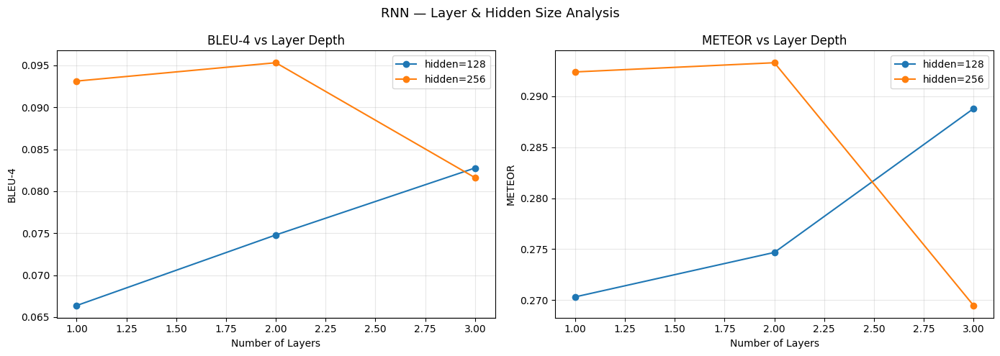

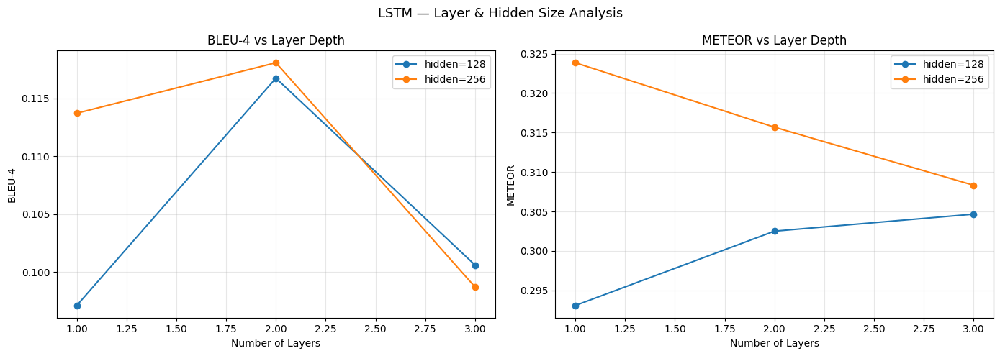

In [12]:
for arch in ["rnn", "lstm"]:
    arch_results = [r for r in results if r["arch"] == arch]
    if not arch_results:
        continue

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{arch.upper()} — Layer & Hidden Size Analysis", fontsize=13)

    for hidden_size in sorted(set(r["hidden_size"] for r in arch_results)):
        subset = sorted([r for r in arch_results if r["hidden_size"] == hidden_size], key=lambda x: x["n_layers"])
        layers = [r["n_layers"] for r in subset]
        bleus  = [r["bleu4"]   for r in subset]
        meteors = [r["meteor"] for r in subset]

        axes[0].plot(layers, bleus,   marker="o", label=f"hidden={hidden_size}")
        axes[1].plot(layers, meteors, marker="o", label=f"hidden={hidden_size}")

    axes[0].set_xlabel("Number of Layers")
    axes[0].set_ylabel("BLEU-4")
    axes[0].set_title("BLEU-4 vs Layer Depth")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].set_xlabel("Number of Layers")
    axes[1].set_ylabel("METEOR")
    axes[1].set_title("METEOR vs Layer Depth")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

**Kesimpulan**: Dari grafik dapat terlihat bahwa untuk RNN nilai BLEU-4 terbaik ada pada layernya 2 dengan hidden unit sebesar 256 dengan nilai BLEU-4 sebesar 0.0953 dan METEOR sebesar 0.2933, dimana ini merupakan sweetspot dari RNN. 

Kemudian untuk LSTM, terlihat bahwa layer sebanyak 2 dengan hidden unit sebesar 256 merupakan model terbaik jika dilihat dari BLEU-4 dengan nilai BLEU-4 sebesar 0.1181 dan METEOR sebesar 0.3157. Untuk model LSTM sendiri tidak ada variasi yang mendominasi seperti pada model RNN dimana terdapat variasi yang menjadi puncak di kedua metrik evaluasi.

Selanjutnya, mari kita tinjau satu persatu dari dampak penambahan hidden unitn dan layernya :

1. Hidden Unit : Pada kedua model baik RNN dan LSTM, penambahan hidden unit memberikan dampak positif pada layer sebanyak 1 dan 2, terlihat pada keduanya yang mendapatkan sweetspotnya di hidden unit sebanyak 256. Tetapi terdapat kendala dimana model jadi lebih cepat overfitting ketika ditambahkan layernya, hal ini terlihat dari perilaku penambahan layer menjadi 3 layer di kedua model pada grafik BLEU-4.
2. Layer : Penambahan layer sendiri baik di RNN ataupun LSTM tidak memberikan dampak yang signifikan, bahkan cenderung merugikan jika melihat grafik METEOR LSTM. Kemdian jika kita tinjau lebih dalam lagi, penambahan layer pada model RNN dapat menjadi penyebab utama dari vanishing gradient dan pada model LSTM dapat menjadi penyebab utama overfitting.

### Analysis RNN vs LSTM Comparison

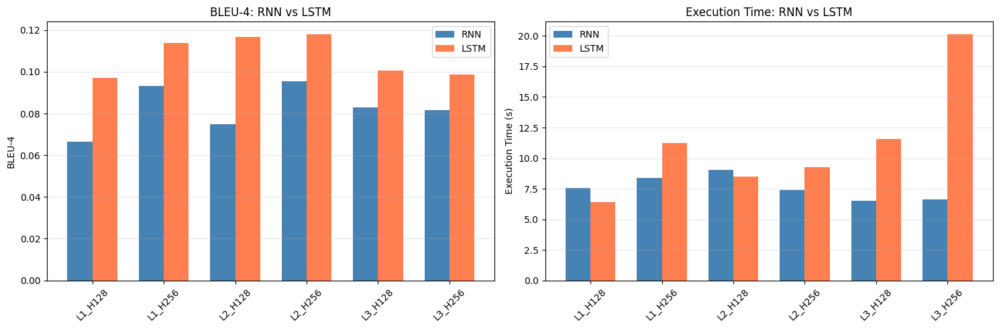

In [13]:
rnn_results  = {(r["n_layers"], r["hidden_size"]): r for r in results if r["arch"] == "rnn"}
lstm_results = {(r["n_layers"], r["hidden_size"]): r for r in results if r["arch"] == "lstm"}

common_keys = sorted(set(rnn_results.keys()) & set(lstm_results.keys()))
labels = [f"L{k[0]}_H{k[1]}" for k in common_keys]

rnn_bleus   = [rnn_results[k]["bleu4"]   for k in common_keys]
lstm_bleus  = [lstm_results[k]["bleu4"]  for k in common_keys]
rnn_times   = [rnn_results[k]["time"]    for k in common_keys]
lstm_times  = [lstm_results[k]["time"]   for k in common_keys]

x = np.arange(len(labels))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].bar(x - width/2, rnn_bleus,  width, label="RNN",  color="steelblue")
axes[0].bar(x + width/2, lstm_bleus, width, label="LSTM", color="coral")
axes[0].set_xticks(x)
axes[0].set_xticklabels(labels, rotation=45)
axes[0].set_ylabel("BLEU-4")
axes[0].set_title("BLEU-4: RNN vs LSTM")
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis="y")

axes[1].bar(x - width/2, rnn_times,  width, label="RNN",  color="steelblue")
axes[1].bar(x + width/2, lstm_times, width, label="LSTM", color="coral")
axes[1].set_xticks(x)
axes[1].set_xticklabels(labels, rotation=45)
axes[1].set_ylabel("Execution Time (s)")
axes[1].set_title("Execution Time: RNN vs LSTM")
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis="y")

plt.tight_layout()
plt.show()

**Kesimpulan**: Terlihat jelas pada grafik BLEU-4 bahwa LSTM mendominasi di setiap variasi arsitekturnya jika dibandingkan dengan RNN, tetapi execution timenya LSTM mayoritas lebih lama dibandingkan dengan RNN, terutama pada layer sebanyak 3 dan hidden unit sebesar 256. Keduanya memiliki alasan yang sama yaitu LSTM menggunakan 4 gates sedangkan RNN hanya 2 gates saja, sehingga dalam waktu eksekusi RNN akan jauh lebih cepat dibandingkan dengan LSTM, tetapi secara akurasi tentu akan kalah dari LSTM.

## Analysis Best Scratch vs Keras Comparison

In [14]:
rnn_results_list  = [r for r in results if r["arch"] == "rnn"]
lstm_results_list = [r for r in results if r["arch"] == "lstm"]

best_rnn  = max(rnn_results_list,  key=lambda x: x["bleu4"]) if rnn_results_list  else None
best_lstm = max(lstm_results_list, key=lambda x: x["bleu4"]) if lstm_results_list else None

if best_rnn:
    print(f"Best RNN  — layers={best_rnn['n_layers']} hidden={best_rnn['hidden_size']} BLEU-4={best_rnn['bleu4']:.4f}")
if best_lstm:
    print(f"Best LSTM — layers={best_lstm['n_layers']} hidden={best_lstm['hidden_size']} BLEU-4={best_lstm['bleu4']:.4f}")

Best RNN  — layers=2 hidden=256 BLEU-4=0.0953
Best LSTM — layers=2 hidden=256 BLEU-4=0.1181


In [15]:
def evaluate_keras_model(keras_model_path, test_ids, all_captions):
    with open(DATA_DIR / 'config.json') as f:
        config = json.load(f)
    max_len = config['max_length']
    expected_len = max_len - 1
    keras_model = tf.keras.models.load_model(keras_model_path, safe_mode=False)
    
    batch_size = 32
    hypotheses = []
    references_list = []
    start_time = time.time()

    for start in range(0, len(test_ids), batch_size):
        batch_ids = test_ids[start:start + batch_size]
        batch_feats = np.array([load_feature(img_id) for img_id in batch_ids])
        B = len(batch_ids)
        sequences = [[START_ID] for _ in range(B)]
        finished = [False] * B

        for t in range(expected_len):
            padded = np.full((B, expected_len), PAD_ID, dtype=np.int32)
            for i, seq in enumerate(sequences):
                seq_len = len(seq)
                padded[i, :seq_len] = seq[:seq_len]

            with tf.device('/CPU:0'):
                preds = keras_model.predict([batch_feats, padded], verbose=0)

            next_tokens = []
            for i, seq in enumerate(sequences):
                if finished[i]:
                    next_tokens.append(END_ID)
                else:
                    seq_len = len(seq)
                    if seq_len > 0:
                        token = int(np.argmax(preds[i, seq_len - 1, :]))
                    else:
                        token = START_ID
                    next_tokens.append(token)

            for i, token in enumerate(next_tokens):
                if not finished[i]:
                    if token == END_ID:
                        finished[i] = True
                    else:
                        sequences[i].append(token)

            if all(finished):
                break

        for i, img_id in enumerate(batch_ids):
            caption_ids = sequences[i][1:]
            hypotheses.append(tokenizer.decode(caption_ids))
            references_list.append(all_captions[img_id])

    elapsed = time.time() - start_time
    bleu4 = compute_bleu4(hypotheses, references_list)
    meteor = compute_meteor(hypotheses, references_list)
    return bleu4, meteor, elapsed


rnn_arch_map  = {(r["n_layers"], r["hidden_size"]): i+1 for i, r in enumerate([r for r in results if r["arch"] == "rnn"])}
lstm_arch_map = {(r["n_layers"], r["hidden_size"]): i+1 for i, r in enumerate([r for r in results if r["arch"] == "lstm"])}

for best, label in [(best_rnn, "RNN"), (best_lstm, "LSTM")]:
    if best is None:
        continue
    arch     = best["arch"]
    n_layers = best["n_layers"]
    hsize    = best["hidden_size"]
    arch_map = rnn_arch_map if arch == "rnn" else lstm_arch_map
    v_idx    = arch_map[(n_layers, hsize)]
    path     = WEIGHTS_DIR / f"{arch}_v{v_idx}_L{n_layers}_H{hsize}.keras"

    print(f"\nKeras evaluation for best {label} ({n_layers}L, {hsize}H) ...")
    keras_bleu4, keras_meteor, keras_time = evaluate_keras_model(str(path), test_ids, all_captions)

    print(f"  Scratch — BLEU-4={best['bleu4']:.4f} | METEOR={best['meteor']:.4f} | Time={best['time']:.1f}s")
    print(f"  Keras   — BLEU-4={keras_bleu4:.4f} | METEOR={keras_meteor:.4f} | Time={keras_time:.1f}s")


Keras evaluation for best RNN (2L, 256H) ...


I0000 00:00:1778769721.826511  385370 service.cc:153] XLA service 0x71d30c034dc0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778769721.826543  385370 service.cc:161]   StreamExecutor [0]: Host, Default Version (Driver: 0.0.0; Runtime: 0.0.0; Toolkit: 0.0.0; DNN: 0.0.0)
I0000 00:00:1778769721.846728  385370 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1778769721.984147  385370 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  Scratch — BLEU-4=0.0953 | METEOR=0.2933 | Time=7.4s
  Keras   — BLEU-4=0.0953 | METEOR=0.2933 | Time=58.2s

Keras evaluation for best LSTM (2L, 256H) ...
  Scratch — BLEU-4=0.1181 | METEOR=0.3157 | Time=9.3s
  Keras   — BLEU-4=0.1181 | METEOR=0.3157 | Time=67.2s


**Kesimpulan**: Untuk hasil dari scratch vs keras tentu akan menghasilkan hasil yang serupa, dimana hal tersebut menunjukkan bahwa implementasi logic dari kode from scratch telah sesuai. Tetapi seperti yang terlihat bahwa performance dari Scratch jauh lebih cepat dibandingkan dengan Keras, hal tersebut mungkin saja terjadi karena framework dari keras sendiri yang mengharuskan overhead ketika melakukan autoregressive decoding sehingga ada bottleneck disana.

## Qualitative Analysis

In [16]:
def get_sample_indices_by_quality(hypotheses, references_list, n_high=4, n_mid=3, n_low=3):
    smoothie = SmoothingFunction().method4
    per_image_bleu = []
    for hyp, refs in zip(hypotheses, references_list):
        s = sentence_bleu([r.split() for r in refs], hyp.split(), smoothing_function=smoothie)
        per_image_bleu.append(s)

    sorted_idx = np.argsort(per_image_bleu)
    low_idx  = sorted_idx[:n_low].tolist()
    mid_idx  = sorted_idx[len(sorted_idx)//2 - n_mid//2 : len(sorted_idx)//2 + n_mid//2 + 1][:n_mid].tolist()
    high_idx = sorted_idx[-n_high:][::-1].tolist()
    return high_idx + mid_idx + low_idx, per_image_bleu

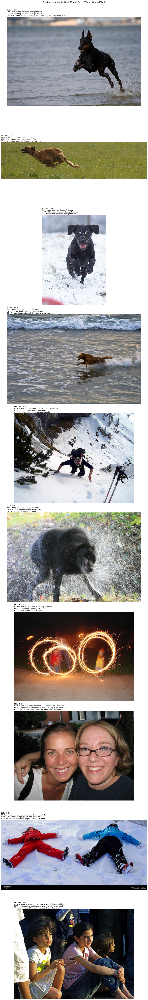

In [17]:
if best_rnn and best_lstm:
    rnn_hyps  = best_rnn["hypotheses"]
    lstm_hyps = [r for r in results if r["arch"] == "lstm" and
                 r["n_layers"] == best_lstm["n_layers"] and
                 r["hidden_size"] == best_lstm["hidden_size"]][0]["hypotheses"]
    refs_list = best_rnn["references"]

    sample_indices, per_image_bleu = get_sample_indices_by_quality(lstm_hyps, refs_list)
    sample_ids = [test_ids[i] for i in sample_indices]

    fig, axes = plt.subplots(10, 1, figsize=(12, 80))

    for ax, img_idx, img_id in zip(axes, sample_indices, sample_ids):
        img_path = IMAGES_DIR / img_id
        img = mpimg.imread(str(img_path))
        ax.imshow(img)
        ax.axis("off")

        rnn_caption  = rnn_hyps[img_idx]  if img_idx < len(rnn_hyps)  else "N/A"
        lstm_caption = lstm_hyps[img_idx] if img_idx < len(lstm_hyps) else "N/A"
        gt_caption   = refs_list[img_idx][0] if refs_list[img_idx] else "N/A"
        bleu_score   = per_image_bleu[img_idx]

        title = (
            f"BLEU-4={bleu_score:.3f}\n"
            f"RNN : {rnn_caption}\n"
            f"LSTM: {lstm_caption}\n"
            f"GT  : {gt_caption}"
        )
        ax.set_title(title, fontsize=9, loc="left", pad=4)

    plt.suptitle("Qualitative Analysis: Best RNN vs Best LSTM vs Ground Truth", y=1.002, fontsize=12)
    plt.tight_layout()
    plt.show()

**Analisis**: Mulai dari konteks dengan nilai BLEU-4 tinggi hingga rendah, semuanya konsisten bahwa model LSTM menunjukkan hasil yang lebih akurat dibandingkan RNN, hal tersebut disebabkan oleh LSTM yang memiliki kelebihan dalam "memahami" konteks dengan lebih baik karena komponen 4 gates yang dimilikinya. RNN yang tidak memiliki fitur tersebut dengan cepat mengalami vanishing gradient atau bisa dibilang "melupakan" konteks yang terjadi cukup jauh, sehingga hasil nya terbilang cukup halusinasi. Walaupun LSTM sudah cukup kuat untuk nilai BLEU tinggi, tetapi untuk konteks dengan BLEU-4 rendah, model lstm pun cukup kesulitan untuk memahami dan memprediksi konteks yang sedang diberikan.

## Analysis Max Caption Length Experiments

Best overall: LSTM L=2 H=256 BLEU-4=0.1181
max_len= 10 | BLEU-4=0.1207 | METEOR=0.3079 | Time=5.2s
max_len= 20 | BLEU-4=0.1181 | METEOR=0.3157 | Time=7.8s
max_len= 30 | BLEU-4=0.1181 | METEOR=0.3157 | Time=7.5s
max_len= 40 | BLEU-4=0.1181 | METEOR=0.3157 | Time=7.9s
max_len= 50 | BLEU-4=0.1181 | METEOR=0.3157 | Time=7.7s


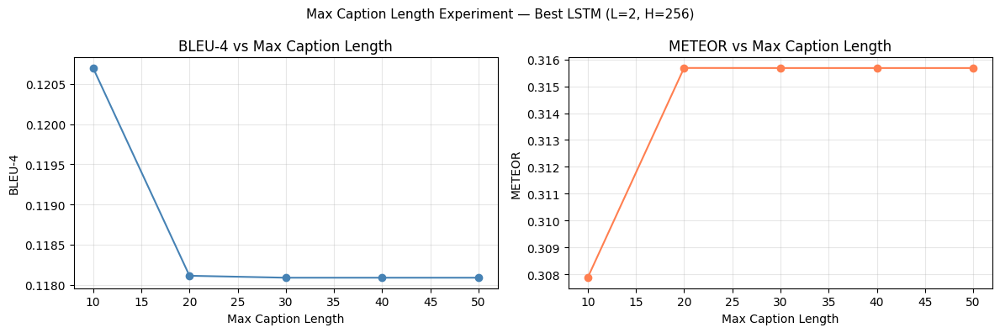

In [18]:
best_overall = max(results, key=lambda x: x["bleu4"]) if results else None

if best_overall:
    print(f"Best overall: {best_overall['arch'].upper()} L={best_overall['n_layers']} H={best_overall['hidden_size']} BLEU-4={best_overall['bleu4']:.4f}")

    arch     = best_overall["arch"]
    n_layers = best_overall["n_layers"]
    hsize    = best_overall["hidden_size"]
    arch_map = {(r["n_layers"], r["hidden_size"]): i+1 for i, r in enumerate([r for r in results if r["arch"] == arch])}
    v_idx    = arch_map[(n_layers, hsize)]
    model_path = WEIGHTS_DIR / f"{arch}_v{v_idx}_L{n_layers}_H{hsize}.keras"

    if arch == "rnn":
        emb, proj, dec, out = load_rnn_decoder(str(model_path), EMBED_DIM, n_layers)
        base_fn = lambda feat, max_len: generate_greedy_rnn(feat, emb, proj, dec, out, max_len)
    else:
        emb, proj, dec, out = load_lstm_decoder(str(model_path), EMBED_DIM, n_layers)
        base_fn = lambda feat, max_len: generate_greedy_lstm(feat, emb, proj, dec, out, max_len)

    max_len_values = [10, 20, 30, 40, 50]
    maxlen_bleu4   = []
    maxlen_meteor  = []

    for ml in max_len_values:
        bleu4, meteor, elapsed, _, _ = evaluate_model(base_fn, test_ids, all_captions, max_len=ml)
        maxlen_bleu4.append(bleu4)
        maxlen_meteor.append(meteor)
        print(f"max_len={ml:>3} | BLEU-4={bleu4:.4f} | METEOR={meteor:.4f} | Time={elapsed:.1f}s")

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(max_len_values, maxlen_bleu4, marker="o", color="steelblue")
    axes[0].set_xlabel("Max Caption Length")
    axes[0].set_ylabel("BLEU-4")
    axes[0].set_title("BLEU-4 vs Max Caption Length")
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(max_len_values, maxlen_meteor, marker="o", color="coral")
    axes[1].set_xlabel("Max Caption Length")
    axes[1].set_ylabel("METEOR")
    axes[1].set_title("METEOR vs Max Caption Length")
    axes[1].grid(True, alpha=0.3)

    plt.suptitle(f"Max Caption Length Experiment — Best {arch.upper()} (L={n_layers}, H={hsize})", fontsize=11)
    plt.tight_layout()
    plt.show()

**Kesimpulan**: Pada model terbaik (berdasarkan metrik BLEU-4) yaitu LSTM dengan 2 layer dan 256 hidden unit, skor dari BLEU-4 memuncak pada max length 10. Hal tersebut mungkin saja terjadi karena pemotongan sekuens secara paksa membatasi model untuk hanya mengeluarkan kata-kata pembuka yang paling aman dan berakurasi tinggi, sekaligus mencegah munculnya kata-kata halusinasi di sisa kalimat. Sebaliknya, METEOR baru mencapai tingkat optimal pada max_len=20 karena sifat metriknya yang mementingkan recall dan kelengkapan semantik dari deskripsi gambar. Lebih jauh lagi, skor dan waktu inferensi yang sepenuhnya stagnan dari batas 20 hingga 50 membuktikan bahwa arsitektur model telah berhasil memetakan token <end> dengan tepat sehingga proses dekode selalu dihentikan secara mandiri sebelum menyentuh batas karakter maksimum.